# Categorical Data Analysis


## Types of Variables

As the title for this class suggests, we will primarily be working with categorical data.  Only in one or two contexts will quantitative data be used.  

Examples of categorical data include:

+ Sex

+ Race

+ Month

+ Rank

+ Color (of something, like a car)

+ Type (of something, like an engine or transmission)

Things that are measured with numbers are quantitative variables, such as:

+ Height/Weight

+ GPA or test scores

+ MPG

Sometimes, things that are recorded as numbers and might seem like they should be used as quantitative variables would actually be more appropriately regarded as categorical variables.

+ Cylinders in a car engine

+ Breaking a quantitative variable into "bins" (this is frequently done with income)


## Ordinal vs Nominal variables

Within categorical variables we find that some categorical variables have an implied order.  Such variables are referred to as *ordinal* variables.  They are sometimes called hierachical variables and may also be referred to as factors.  There may be some subtle difference in what these terms mean respective to different fields, but we will treat them as interchangeable; in fact, I'll just stick to the term ordinal.  When the labels used with a variable are just that, labels without any implied order, those variables are nominal.  Linguists may recognize that the *nom* part of this word is similar to the word name in many languages, and changing the name of something doesn't really change it's characteristics, and names don't have any inherit order.    

Ordinal examples:

+ Ranks (for example Fr, So, Ju, Sn)

+ Months

+ A numeric variable broken into bins or ranges

+ Cylinders in a car

Nominal examples:

+ Sex

+ Political Party


Quick aside about Jupyter Notebooks.  You may be viewing this document as an HTML file, or you may be viewing it on our datahub.  If you're viewing it on the hub, then you're looking at it as a Jupyter notebook.  

This cell is a Markdown cell.  It allows us to type text, embed graphics, hyperlinks, etc. I need to run a little bit of Python code to go on to the next topic, so let me do that now.  

In [1]:
# This cell is a code cell.  In cells like this
# we run Python code

# Here's some code that will likely appear near the top of every homework or lecture this semester.

from datascience import *
import numpy as np

%matplotlib inline
import matplotlib.pyplot as plots
plots.style.use('fivethirtyeight')

import scipy.stats as stats

import scipy

import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=np.VisibleDeprecationWarning)

# To add text, referred to as comments to a code cell
# just put a hashtag a the beginning of the comment
# Comments are ignored by the computer when executing the code

## Working with data

Many times, the data that we want to analyze will already be summarized for us, and as long as it's not *too* summarized, we will probably be able to use it.  

This data on the effectiveness of AZT at preventing HIV from converting to AIDS is an example where the data is already pretty summarized, but we are able to work with it to answer some essential questions.  

In [2]:
azt = Table.read_table("AIDS.csv" )
azt

race,azt,yes,no
white,yes,14,93
white,no,32,81
black,yes,11,52
black,no,12,43


Other times, our data will not be summarized.  Then we have to do some work to get the data in the format that **we** need it in.

In [3]:
# In this cell, we will load and view a dataset

mort22 = Table.read_table("SmallMort2022.csv")

mort22

Sex,Race,Month_of_Death,Heart,Suicide
M,White,10,No,No
F,White,11,No,No
F,White,5,Yes,No
M,White,10,No,No
F,White,7,No,No
M,White,11,No,No
F,White,11,Yes,No
F,White,10,Yes,No
M,White,7,No,No
M,Black,11,No,No


The table methods known as `.group` and `.pivot` are useful in transforming data in long form into the summarized forms that lend themselves to direct analysis and/or interpretation.  

In [4]:
mort22.pivot("Sex", "Suicide")

Suicide,F,M
No,620928,674905
Yes,4138,15856


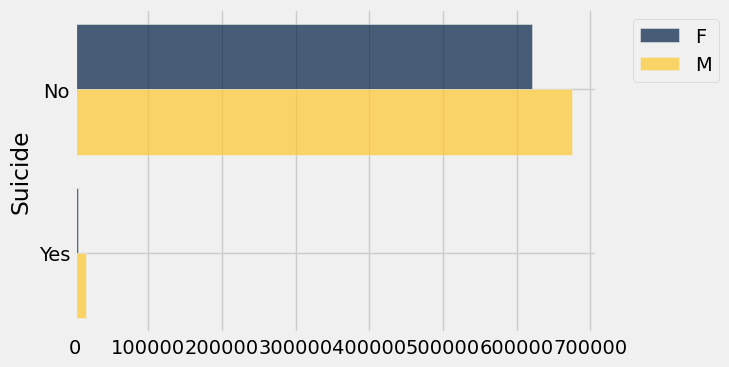

In [5]:
mort22.pivot("Sex", "Suicide").barh("Suicide")

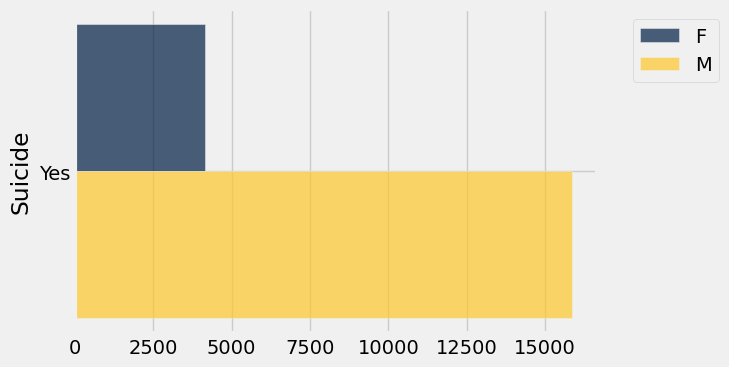

In [6]:
mort22.pivot("Sex", "Suicide").take(1).barh("Suicide")

Notice how *verrry* long it took to run those last three cells.  `.pivot` is computationally expensive, so much so that it would be more efficient to save the result of the first `.pivot` and then use that saved result in the next cells.  

In [7]:
Sex_Suicide_table = mort22.pivot("Sex", "Suicide")

Sex_Suicide_table

# This cells still take forever to run, because we are still using .pivot
# but the next cells, you'll see run much faster.

Suicide,F,M
No,620928,674905
Yes,4138,15856


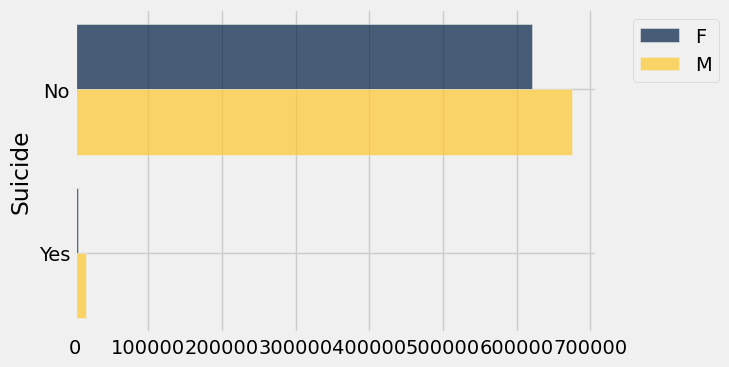

In [8]:
Sex_Suicide_table.barh("Suicide")

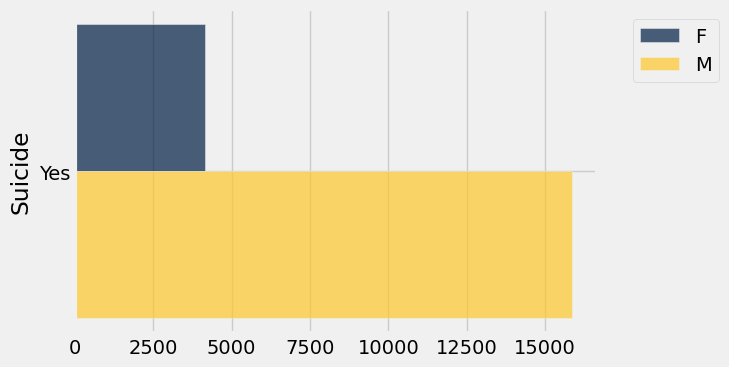

In [9]:
Sex_Suicide_table.take(1).barh("Suicide")

## Back to the Mort22 data

In [10]:
# Use .show to pick some number of rows to examine

mort22.show(5)

# WARNING: with these large data sets, Never use .show() without putting a number in the
# parentheses.  

Sex,Race,Month_of_Death,Heart,Suicide
M,White,10,No,No
F,White,11,No,No
F,White,5,Yes,No
M,White,10,No,No
F,White,7,No,No


In [11]:
table1 = mort22.group("Sex")

table1

Sex,count
F,625066
M,690761


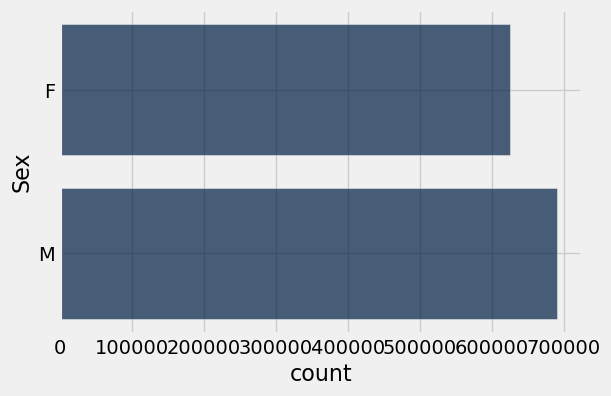

In [12]:
table1.barh("Sex")

In [13]:
table2 = mort22.group("Race")
table2

Race,count
AIAN,10141
API,39950
Black,167850
Other/Mixed,6435
White,1091451


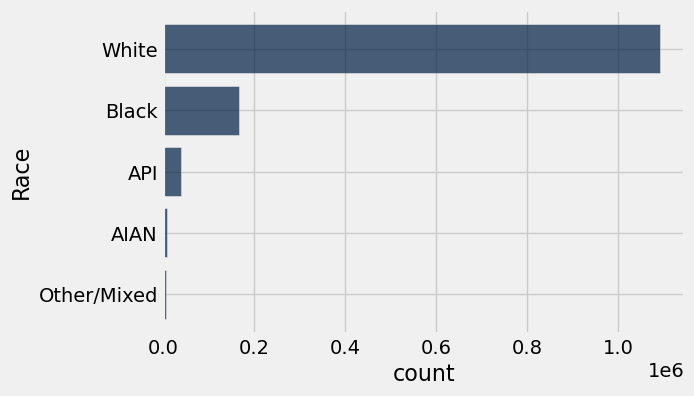

In [14]:
table2.sort("count", True).barh("Race")

In [15]:
table3 = mort22.pivot( "Suicide", "Race")

table3

Race,No,Yes
AIAN,9858,283
API,39236,714
Black,166236,1614
Other/Mixed,6231,204
White,1074272,17179


Suicide is rare event, so in most groups the bar representing the number of suicides is not visible.  

See below. 

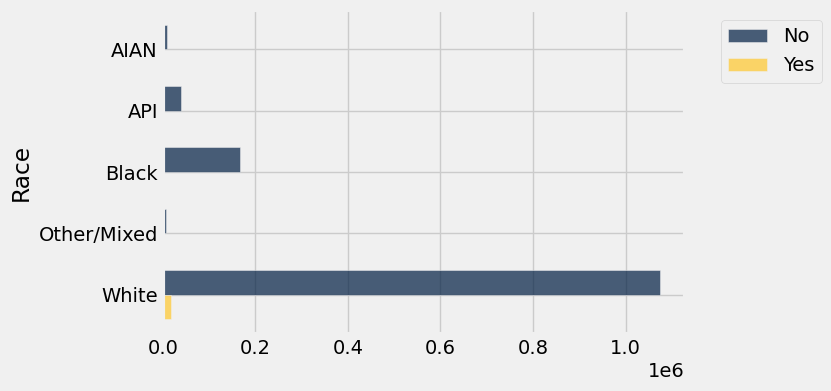

In [16]:
table3.barh("Race")

We can fix this at least two ways, both of which involve getting rid of the No's.

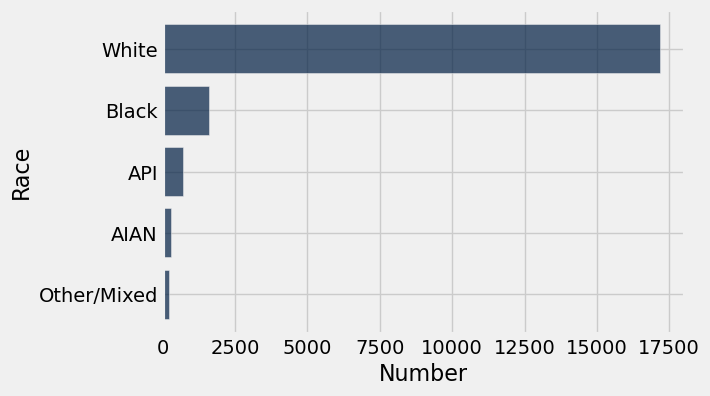

In [18]:
table3.drop("No").relabel("Yes", "Number").sort("Number", True).barh("Race")

In [19]:
suicide22 = mort22.where("Suicide", "Yes")

suicide22

Sex,Race,Month_of_Death,Heart,Suicide
M,White,3,No,Yes
M,White,10,No,Yes
M,White,9,No,Yes
M,Black,5,No,Yes
M,Black,9,No,Yes
M,White,6,No,Yes
M,White,6,No,Yes
M,White,4,No,Yes
M,White,11,No,Yes
M,White,10,No,Yes


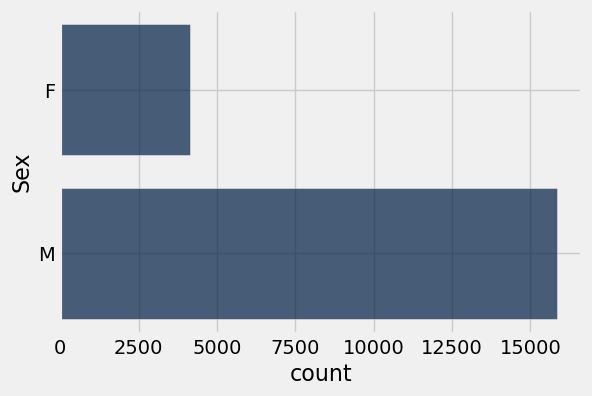

In [28]:
suicide22.group("Sex").barh("Sex")

In [20]:
table4 = mort22.pivot( "Suicide", "Month_of_Death")

table4

Month_of_Death,No,Yes
1,146057,1645
2,114780,1570
3,105922,1638
4,97580,1589
5,100750,1861
6,97494,1757
7,103073,1688
8,102053,1769
9,99009,1667
10,104262,1674


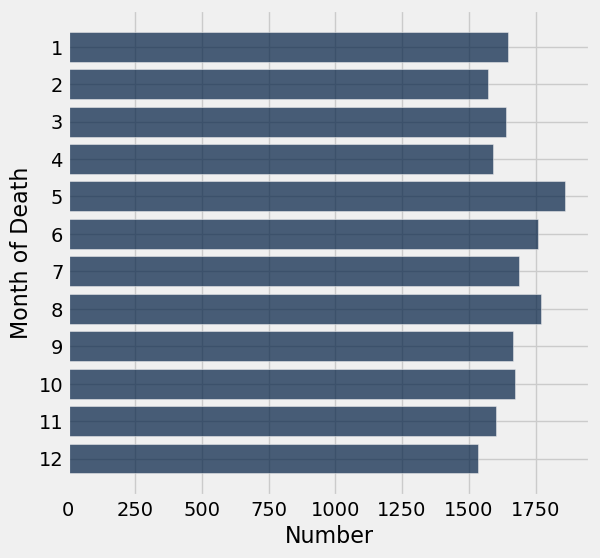

In [21]:
table4.relabel("Yes", "Number").drop("No").relabel("Month_of_Death", "Month of Death").barh("Month of Death")

In [22]:
table5 = mort22.pivot("Suicide", "Sex")
table5


Table.to_csv(table5, "SuicideAndSexTable.csv")

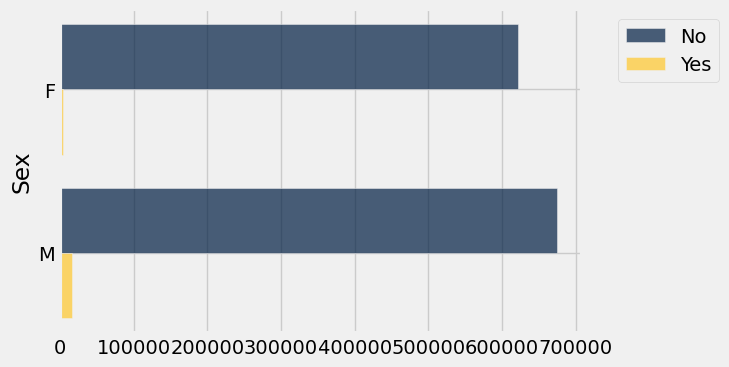

In [23]:
table5.barh("Sex")

## Something fun:  Bigfoot Sightings

If you'd like to see bigfoot, when/where should you look?  This data was found on Kaggle where it was provided by the [Bigfoot Field Researchers Organization](https://www.kaggle.com/datasets/thedevastator/unlocking-mysteries-of-bigfoot-through-sightings).

In [24]:
bigfoot = Table.read_table("bfro_fixed.csv")

formap = bigfoot.select("lat", "lon")

Circle.map_table(formap, area = 3)

### Use color to indicate the season.  

<span style="color: red;">Summer</span>

<span style="color: orange;">Fall</span>

<span style="color: blue;">Winter</span>

<span style="color: green;">Spring</span>

In [25]:
col = np.repeat("orange", formap.num_rows)

season = bigfoot.column("season")

for i in np.arange(formap.num_rows):
    if season.item(i)== "Spring":
        col[i] = "green"
    elif season.item(i)== "Winter":
        col[i] = "blue"
    elif season.item(i)== "Summer":
        col[i] = "red"

formap = formap.with_column("color", col)

Circle.map_table(formap, area = 3)

In [26]:
region = np.repeat("Southeast", formap.num_rows)


state = bigfoot.column("state")

for i in np.arange(formap.num_rows):
    if state.item(i) in make_array("New York", "Pennsylvania", "New Jersey", "Maine", "Vermont", "New Hampshire", "Rhode Island"
                                   , "Connecticut", "Massachusetts", "Delaware", "Maryland"):
        region[i] = "Northeast"
    elif state.item(i) in make_array("California", "Alaska", "Washington", "Oregon", "Montana", "Idaho",
                                    "Nevada", "Utah", "Arizona", "New Mexico", "Colorado", "Wyoming",):
        region[i] = "West"
    elif state.item(i) in make_array("Oklahoma", "Kansas", "Missouri", "Iowa", "Nebraska", "South Dakota", "North Dakota",
                                    "Minnesota", "Wisconsin", "Illinois", "Indiana", "Ohio", "Michigan"):
        region[i] = "Midwest"

bigfoot = bigfoot.with_column("region", region)


bigfoot.pivot("region", "season")

season,Midwest,Northeast,Southeast,West
Fall,362,70,376,399
Spring,197,39,212,220
Summer,407,76,418,586
Unknown,17,1,29,17
Winter,164,35,249,171


So, looking at this output, it would seem that the West in the Summer might be the best time and place to look for him.  This analysis is not perfect.  What things am I overlooking?  If you think about it, I'm sure you can come up with a lurking variable or two that this analysis does not (and can not, given the data we have) control for.  


We're not really ready to report any big conclusions from this data yet.  We'll continue looking at these data sets over the course of the semester and maybe by the end, we'll have some big results to report.  


### A note about data cleaning

Whenever our data needs to be cleaned to the extent that is shown above, **I** will do that for us, usually outside of class and very often I won't even show you what I did to clean the data.  

Cleaning data is something that we *could* study for the entire semester, but that's not what this class is about.  Some very light cleaning, like using `.pivot` or `.group`, is reasonable to include and would likely to unavoidable in practice anyway.  But, to be clear, I'm not expecting you to learn complex cleaning methods for this class.  


